In [1]:
using Bootstrap
using ColorSchemes
using CSV
using DataFrames
using Dates
using ImageFiltering
using Measures
using Measurements
using Plots
using Statistics
using StatsPlots
using Unitful

Load some basic utility code

In [2]:
rootfolder = normpath(joinpath(@__DIR__, "..", "..", "..", ".."))
include(joinpath(rootfolder, "figures", "utils.jl"))

Load CSV from disk and load the volume measurements with the associated error
and add the XY resolution

In [3]:
types = Dict([:rel_volume, :abs_volume_um3] .=> Measurement{Float64})
linked = CSV.File(joinpath(rootfolder, "data", "fxm_uncaging_augmented.csv"), types = types) |> DataFrame
filter!(x->x.isencapsulated, linked);
# This value was computed manually for our 20x objective
linked.xunit = linked.x .* 0.653u"μm"
linked.yunit = linked.y .* 0.653u"μm";
linked.time = uconvert.(u"minute", linked.time_s .* u"s");
linked.reltime = linked.time .- 15u"minute"; # uncaging always happens at 15 minutes in

Compute the median volume and footprint area for each replicate at each time
point

In [4]:
med_vols = combine(groupby(linked, [:reltime, :condition, :date, :dish]),
    :abs_volume_um3 => (x->median(Measurements.value.(x))) => :med_vol,
    :area_um2 => (x->median(Measurements.value.(x))) => :med_area,
    :abs_volume_um3 => length => :n);

Normalize the volumes to the average median volume in the 2 minutes prior to
activation.

In [5]:
relative_med_vols = combine(groupby(med_vols, [:condition, :date, :dish]),
                            [:reltime, :med_vol] => ((t, v)->v ./ mean(v[-2u"minute" .< t .< 0u"minute"])) => :rel_med_vol,
                            :reltime, :n);

Compute the 95% confidence interval by bootstrapping the replicates

In [6]:
relative_med_vols_mean = combine(groupby(relative_med_vols, [:reltime, :condition]),
                            :rel_med_vol => (x->NamedTuple{(:v, :l, :u)}(confint(bootstrap(mean, x, BasicSampling(1_000)), BasicConfInt(0.95))[1])) => AsTable,
                            :n => (x->Ref(Array(x))) => :n_counts, :n => length, :reltime);

Throw out the data while the UV light is on since the UV LED wasn't switched
off perfectly.

In [7]:
relative_med_vols_mean[0.0u"minute" .<= relative_med_vols_mean.reltime .< 0.5u"minute", [:v, :l, :u]] .= NaN;

## Plot the volume response of Latrunculin vs WT cells

qt.qpa.xcb: could not connect to display 
qt.qpa.plugin: Could not load the Qt platform plugin "xcb" in "" even though it was found.
This application failed to start because no Qt platform plugin could be initialized. Reinstalling the application may fix this problem.

Available platform plugins are: linuxfb, minimal, offscreen, vnc, xcb.

Aborted (core dumped)
connect: Connection refused
GKS: can't connect to GKS socket application

GKS: Open failed in routine OPEN_WS
GKS: GKS not in proper state. GKS must be either in the state WSOP or WSAC in routine ACTIVATE_WS


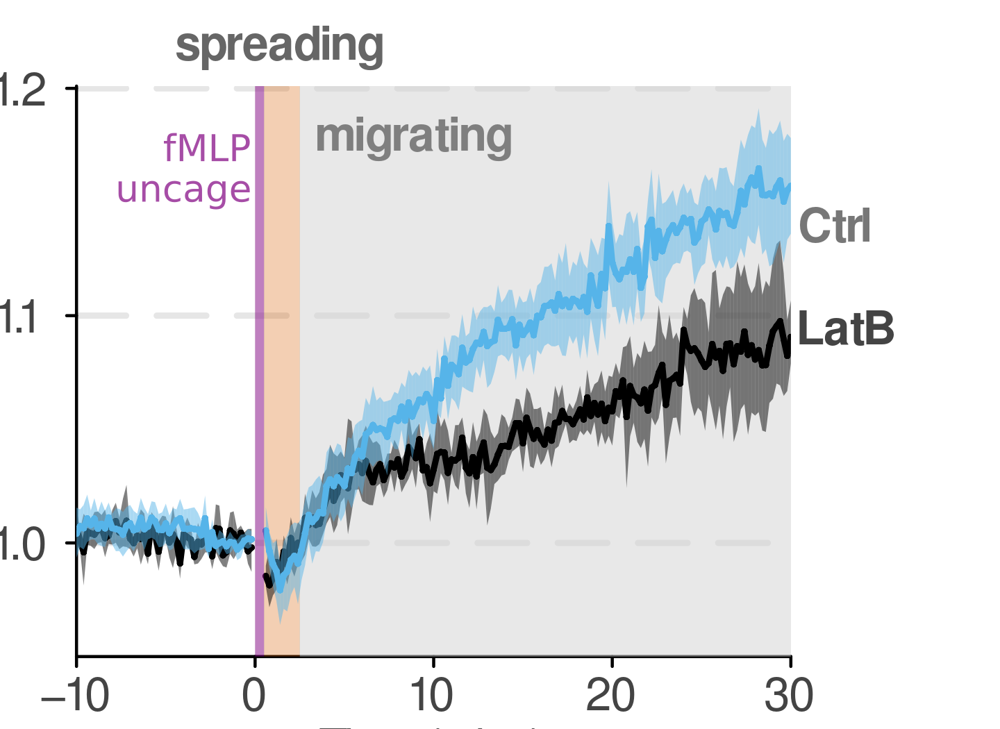

In [8]:
cmap = Dict("WT" => okabe_ito[1], "BIX" => okabe_ito[2], "Duvel" => okabe_ito[4], "BIXOSMO" => okabe_ito[8], "LatB" => okabe_ito[5])
vspan([2.5u"minute", 30u"minute"], alpha = 0.5, c = colorant"lightgray")
vspan!([0.5u"minute", 2.5u"minute"], label = "", alpha = 0.3, c = okabe_ito[8])
p = @df sort(filter(x->x.condition in ["WT", "LatB"] , relative_med_vols_mean), :reltime) plot!(:reltime,
    :v, group = :condition, ribbon = (:v .- :l, :u .- :v),
    ylabel = "Normalized cell volume", xlabel = P"Time (mins)",
    yticks = collect(0.90:0.1:1.20),
    framestyle = :axes, grid = :y, ylim = (0.95, 1.201),
    xticks = -10:10:30,
    xlim = (-10, 30), top_margin = 5mm, right_margin = 15mm,
    linewidth = 2, c = getindex.(Ref(cmap), :condition), leg = false, size = (480, 350))

annotate!(30.5, 1.14, text("Ctrl", "Helvetica Bold", okabe_ito[1], :left, 10))
annotate!(30.5, 1.095, text("LatB", "Helvetica Bold", okabe_ito[5], :left, 10))
vspan!([0, 0.5], label = "", alpha = 0.5, c = colorant"purple")
annotate!(-0.3, 1.165, text("fMLP\nuncage", RGBA(colorant"purple", 0.7), :right, 8))
annotate!(3.5, 1.18, text("migrating", "Helvetica Bold", colorant"gray", :left, 10))
annotate!(1.5, 1.22, text("spreading", "Helvetica Bold", RGBA(okabe_ito[8], 0.5), :center, 10))

savefig(p, joinpath("assets", "wt_vs_latb_volume.svg"))
p

## Plot the tracks of a representative WT condition

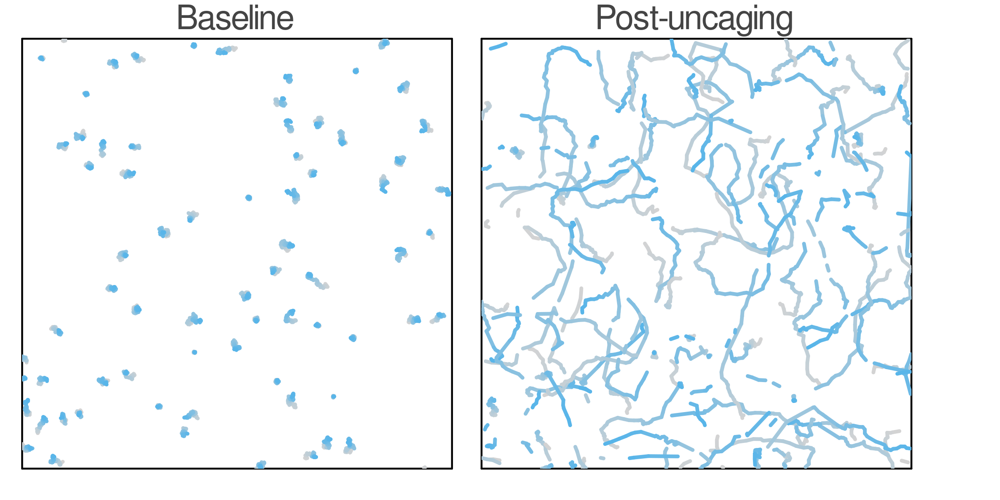

In [9]:
rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])
function plottracks(df, cs)
    filter!(x->(256 .< x.x .< 768) .& (256 .< x.y .< 768), df)
    p1 = @df filter(x->x.reltime < 0u"minute", df) plot(:xunit, :yunit, group = :particle, line_z = :frame,
        leg = false, c = cgrad(cs), aspect_ratio = 1.0, xlim = (256, 768) .* 0.653, ylim = (256, 768) .* 0.653,
        linewidth = 2, xformatter = (_->""), yformatter = _ -> "", xlabel = "", ylabel = "",
        xgrid = false, ygrid = false, xticks = false, yticks = false, yflip = true,
        title = "Baseline")
    plot!(rectangle(50/0.653,15,550 + 10, 620 + 10),
          linewidth = 0, c=colorant"black", label = "")
    p2 = @df filter(x->x.reltime > 15u"minute", df) plot(:xunit, :yunit, group = :particle, line_z = :frame,
        leg = false, c = cgrad(cs), aspect_ratio = 1.0, xlim = (256, 768) .* 0.653, ylim = (256, 768) .* 0.653, left_margin = -10mm,
        linewidth = 2, xformatter = (_->""), yformatter = _ -> "", xlabel = "", ylabel = "",
        xgrid = false, ygrid = false, xticks = false, yticks = false, yflip = true,
        title = "Post-uncaging")
    plot!(rectangle(50/0.653,15,550 + 10, 620 + 10),
          linewidth = 0, c=colorant"black", label = "")
    plot(p1, p2, size = (800, 400))
end

tmp = filter(x -> x.condition == "WT" && x.date == Date(2023, 3, 6) && x.dish == "dish1", linked)

cs = ColorScheme([colorant"lightgray", okabe_ito[1]], "custom", "wt gradient")

plottracks(tmp, cs)

## Plot the tracks of a representative LatB condition

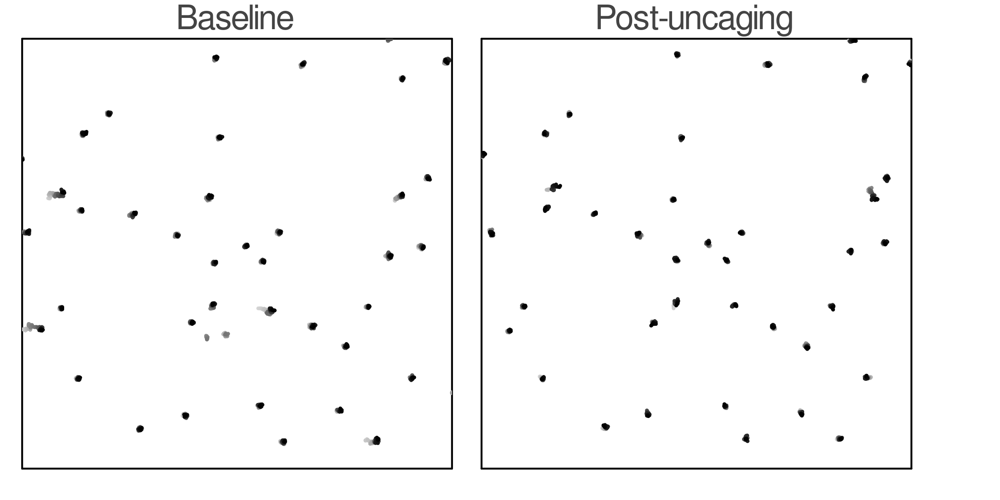

In [10]:
tmp = filter(x -> x.condition == "LatB" && x.date == Date(2023, 9, 27) && x.dish == "dish2", linked)

cs = ColorScheme([colorant"lightgray", okabe_ito[5]], "custom", "wt gradient")

plottracks(tmp, cs)

## Latrunculin vs WT footprint area response

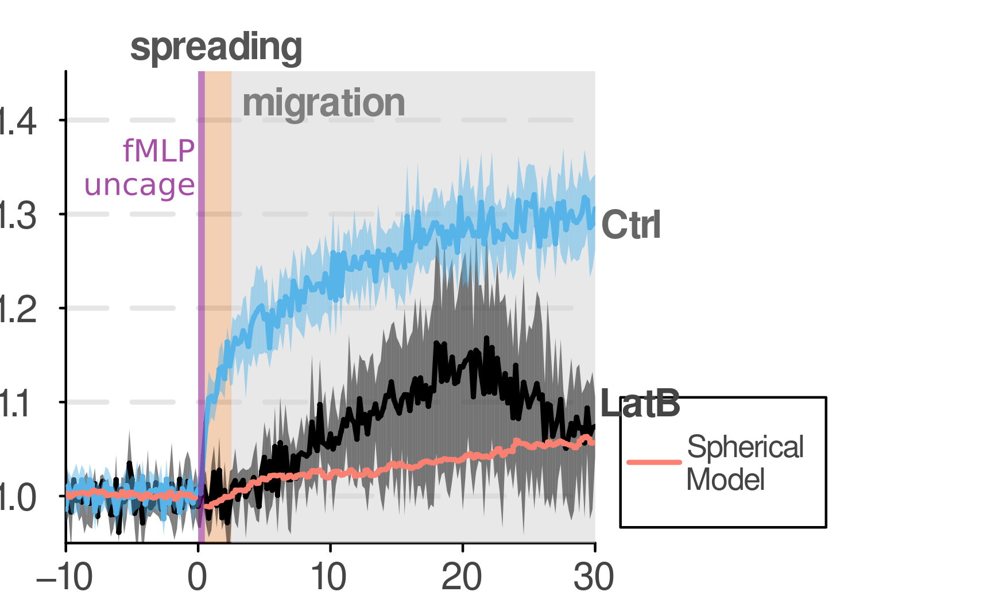

In [11]:
relative_med_vols = combine(groupby(med_vols, [:condition, :date, :dish]),
                            [:reltime, :med_vol] => ((t, v)->v ./ mean(v[-2u"minute" .< t .< 0u"minute"])) => :rel_med_vol,
                            [:reltime, :med_area] => ((t, v)->v ./ mean(v[-2u"minute" .< t .< 0u"minute"])) => :rel_med_area,
                            :reltime, :n)

relative_med_vols_mean = combine(groupby(relative_med_vols, [:reltime, :condition]),
                            :rel_med_vol => std, :reltime,
                            :n => (x->Ref(Array(x))) => :n_counts, :n => length,
                            :rel_med_vol => (x->NamedTuple{(:v, :l, :u)}(confint(bootstrap(mean, x, BasicSampling(1_000)), BasicConfInt(0.95))[1])) => AsTable,
                            :rel_med_area => (x->NamedTuple{(:a, :a_l, :a_u)}(confint(bootstrap(mean, x, BasicSampling(1_000)), BasicConfInt(0.95))[1])) => AsTable)

relative_med_vols_mean[0.0u"minute" .<= relative_med_vols_mean.reltime .< 0.5u"minute", [:v, :l, :u]] .= NaN;

"""Compute the surface area for a given volume"""
surfarea(v) = π ^ (1/3) * (6v)^(2/3)

vspan([2.5u"minute", 30u"minute"], label = "", alpha = 0.5, c = colorant"lightgray")
vspan!([0.5u"minute", 2.5u"minute"], label = "", alpha = 0.3, c = okabe_ito[8])

c1 = colorant"gray50"
filter!(x->x.condition == "WT" || x.condition == "LatB", relative_med_vols_mean)
p = @df sort(relative_med_vols_mean, :reltime, rev = true) plot!(:reltime, :a,
    ribbon = (:a .- :a_l, :a_u .- :a),
    group = :condition,
    ylabel = "Mean rel. footprint size", xlabel = P"Time (mins)", xticks = collect(-10:10:30),
    yticks = collect(1:0.1:1.40),
    framestyle = :axes, grid = :y, ylim = (0.95, 1.452),
    rightmargin = 15mm,
    topmargin = 5mm,
    xlim = (-10, 30), label = "",
    linewidth = 2, c = getindex.(Ref(cmap), :condition),
    leg = :outerbottomright, size = (580, 350))
vspan!([0, 0.5], label = "", alpha = 0.5, c = colorant"purple")
annotate!(-0.3, 1.35, text("fMLP\nuncage", RGBA(colorant"purple", 0.7), :right, 8))
annotate!(30.5, 1.1, text("LatB", "Helvetica Bold", okabe_ito[5], :left, 10))
annotate!(30.5, 1.29, text("Ctrl", "Helvetica Bold", okabe_ito[1], :left, 10))

annotate!(3.5, 1.42, text("migration", "Helvetica Bold", colorant"gray", :left, 10))
annotate!(1.5, 1.48, text("spreading", "Helvetica Bold", RGBA(okabe_ito[8], 0.5), :center, 10))

@df filter(x->x.condition == "LatB", relative_med_vols_mean) plot!(ustrip.(:reltime),
    mapwindow(mean, surfarea.(:v) ./ surfarea(1.0), -3:3), c = colorant"salmon", linewidth = 2,
    label = "Spherical\nModel")

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*